<a href="https://colab.research.google.com/github/fzampirolli/pdi-vc/blob/master/notebooks_alunos/cpp.pt/cap01/cap01_aluno.ipynb"><img src="imagens/colab-badge.png" style="height:20px;vertical-align:middle"></a>
<a href="https://github.com/fzampirolli/pdi-vc"><img src="imagens/github-badge.png" style="height:20px;vertical-align:middle"></a>

# 1 Fundamentos e Primeiros Passos

Este capítulo inaugura a **Parte 1** do livro, dedicada aos fundamentos do Processamento Digital de Imagens (PDI). São apresentados a representação matemática de imagens digitais e os principais métodos para sua manipulação.

Utiliza-se a linguagem C++ e a biblioteca `morph.hpp`, uma porta didática da `morph.py` (ZAMPIROLLI, 2025).

## 1.1 Objetivos

Ao final deste capítulo, você será capaz de:

- Compreender a natureza física e matemática da imagem digital $f(x,y)$.
- Identificar as faixas do espectro eletromagnético relevantes para PDI.
- Realizar operações básicas: leitura, exibição e salvamento de imagens.
- Acessar e modificar intensidades de pixels individualmente.
- Aplicar limiarização manual.

- Configurar o ambiente de desenvolvimento em C++.
- Manipular estruturas de matrizes (`std::vector`) sem cair em armadilhas de cópia/referência.

## 1.2 Antes de começar: *Notebooks* interativos

Este material foi construído sob o conceito de ***Literate Programming*** (Programação Literária), idealizado por Donald Knuth na década de 1980 (KNUTH, 1984). Knuth — também criador do sistema **TeX** para tipografia digital — propôs que os programas fossem escritos como uma narrativa lógica para seres humanos, intercalando código e documentação.

Para executar uma célula, pressione <kbd>Shift</kbd> + <kbd>Enter</kbd> ou clique no botão ▶️.

> ### 📝 Nota sobre o formato
>
> Nas versões renderizadas (PDF ou HTML), o código é apresentado em blocos estáticos para fins de leitura e referência. A execução interativa requer o acesso via Google Colab (disponível no topo da página) ou em ambiente local via VSCode ou Jupyter Notebook.

## 1.3 Fundamentos

O estudo de sistemas baseados em imagens compreende um ecossistema de disciplinas integradas que transformam dados visuais brutos em conhecimento estruturado. Enquanto algumas áreas focam na geração de representações, outras dedicam-se ao tratamento e à análise desses dados para dar suporte a aplicações tecnológicas complexas.

O diagrama apresentado no [Figura 1.1](#fig-01-representacao) estabelece a distinção e complementaridade entre o Processamento Digital de Imagens (PDI) e a Visão Computacional (VC). O PDI, destacado em **verde**, tem como foco a transformação de imagem para imagem, visando melhoria de qualidade ou pré-processamento, como a remoção de ruídos e realce de contraste.

Em contrapartida, a VC, assinalada em **azul**, foca na interpretação do conteúdo visual para extrair modelos ou informações, como o reconhecimento de objetos e gestos. A região de intersecção ilustra a sinergia entre as áreas, onde o PDI prepara os dados visuais para a interpretação pela VC. O mapa também demonstra as interconexões de ambas as disciplinas com áreas como Robótica, Computação Gráfica, Inteligência Artificial (IA) e Neurociência.

<figure id="fig-01-representacao" style="text-align:center; margin:1em 0;">
  <img src="imagens/fig-01-pdf-vc.png" alt="" style="max-width:60%; display:block; margin:auto;" />
  <figcaption><strong>Figura 1.1:</strong> Diagrama relacional detalhando as distinções fundamentais, sinergias e interconexões entre PDI e VC no contexto de sistemas baseados em imagens.</figcaption>
</figure>

### 1.3.1 👁️ Visão Computacional

- **Foco:** *Imagem → Modelo* (caminho inverso da Computação Gráfica).  
- **Objetivo:** Extrair informação de alto nível a partir de imagens ou vídeos.  
- **Aplicações típicas:**
  - Robótica - detecção de obstáculos, localização e navegação autônoma.
  - Vigilância e inspeção - reconhecimento de eventos, leitura de placas, controle de qualidade.
  - Sensoriamento remoto - análise de imagens de satélite, mapeamento ambiental.
  - Imagens médicas - detecção de tumores, segmentação de órgãos, auxílio ao diagnóstico.
  - Interação humano‑computador - reconhecimento de gestos, expressões faciais, rastreamento ocular.
- **Relação com outras áreas:** utiliza técnicas de Aprendizado de Máquina e IA para classificar e interpretar cenas; serve como “olhos” da Robótica.

### 1.3.2 🖼️ Processamento Digital de Imagens (PDI)

- **Foco:** *Imagem → Imagem* (geralmente - transformação de uma imagem em outra).  
- **Objetivo:** Melhorar a qualidade visual ou extrair características de baixo nível.  
- **Aplicações comuns:**
  - Eliminação de ruídos (filtros de média, mediana, gaussiano).
  - Melhoria de contraste (equalização de histograma, ajuste gamma).
  - Detecção de bordas (Sobel, Canny, Laplaciano).
  - Segmentação (limiarização, crescimento de regiões, *watershed*).
  - Transformações geométricas (redimensionamento, rotação, correção de perspectiva).
- **Relação com outras áreas (ver [Tabela 1.1](#tbl-01-relacoes)):**  
  - É a **base** para a maioria dos sistemas de VC (pré‑processamento).  
  - A Computação Gráfica frequentemente aplica PDI para pós‑processamento (ex.: suavização, realce).  
  - Técnicas de IA podem otimizar parâmetros de processamento (ex.: aprendizado de filtros).

<a id="tbl-01-relacoes"></a>

**Tabela 1.1:** Conexão entre PDI, VC e outras áreas da ciência.

| Área                      | Relação com PDI e VC                                                                 |
|---------------------------|--------------------------------------------------------------------------------------|
| **Inteligência Artificial** | Fornece modelos (redes neurais, SVM) que interpretam saídas da VC.                    |
| **Robótica** | Consome dados de VC para tomar decisões (navegação, manipulação).                     |
| **Aprendizado de Máquina**| Usa descritores extraídos pelo PDI/VC para treinar classificadores.                   |
| **Computação Gráfica** | Caminho inverso: *modelo → imagem*; muitas vezes aplica PDI para renderização realista. |
| **Neurociência** | Inspira modelos de PDI (ex.: filtros semelhantes a células ganglionares da retina).   |


## 1.4 Etapas do PDI

As etapas do PDI são apresentadas na [Figura 1.2](#fig-01-etapas), que podem ser compreendidas como uma cadeia de transformações que reduz a redundância dos dados em busca de significado:

*   **Baixo Nível:** Atua diretamente sobre os pixels da imagem ruidosa para realizar melhorias e filtragens, gerando como saída uma imagem limpa ou realçada.
*   **Médio Nível:** Recebe a imagem tratada e realiza a segmentação e descrição, transformando a matriz de pixels em atributos estruturados (forma, tamanho e textura).
*   **Alto Nível:** Utiliza a tabela de atributos para alimentar processos de lógica e inteligência artificial, resultando na decisão ou reconhecimento final (como o diagnóstico médico).

<figure id="fig-01-etapas" style="text-align:center; margin:1em 0;">
  <img src="imagens/fig-01-etapas.png" alt="" style="max-width:60%; display:block; margin:auto;" />
  <figcaption><strong>Figura 1.2:</strong> Representação do fluxo sequencial de processamento: a saída de cada nível torna-se a entrada do nível subsequente.</figcaption>
</figure>


A [Figura 1.3](#fig-01-etapas2) detalha a sequência completa do PDI, desde a captura até a interpretação. O fluxo inicia-se na Aquisição da Imagem (1) e prossegue com o Melhoramento (2) e a Restauração (3). Em seguida, o conteúdo é isolado pela Segmentação (4) e refinado pela Morfologia (5). A transição crucial ocorre na Representação e Descrição (6), onde objetos visuais são convertidos em dados matemáticos (área, perímetro etc.), permitindo o Reconhecimento (7). Processos auxiliares incluem o Processamento de Imagem Colorida e a Compressão, que contribuem para a eficiência do armazenamento e da análise.


<figure id="fig-01-etapas2" style="text-align:center; margin:1em 0;">
  <img src="imagens/fig-01-etapas2.png" alt="" style="max-width:60%; display:block; margin:auto;" />
  <figcaption><strong>Figura 1.3:</strong> Fluxo detalhado do PDI: da aquisição sensorial à extração de atributos e reconhecimento automatizado, incluindo em processamento colorido e compressão.</figcaption>
</figure>

## 1.5 Formação da Imagem e o Espectro

O processo de formação de uma imagem é fundamentado na interação entre a matéria e a energia radiante. Essencialmente, uma imagem é concebida quando um **sensor registra a radiação** resultante da interação com um objeto físico. No contexto da visão humana e da fotografia convencional, este fenômeno depende de uma fonte de luz que ilumine a cena; as características dos objetos são então codificadas através das **variações de intensidade e cor** da luz que atinge o sensor, conforme ilustrado na [Figura 1.4](#fig-01-luz).

<figure id="fig-01-luz" style="text-align:center; margin:1em 0;">
  <img src="imagens/fig-01-luz.png" alt="" style="max-width:60%; display:block; margin:auto;" />
  <figcaption><strong>Figura 1.4:</strong> Representação do espectro visível e sua posição em relação às demais radiações eletromagnéticas, destacando a variação dos comprimentos de onda de 380 nm a 750 nm.</figcaption>
</figure>

A **luz visível** ocupa apenas uma pequena faixa do espectro eletromagnético — entre **380 nm (violeta)** e **750 nm (vermelho)** — conforme ilustrado na [Figura 1.5](#fig-01-espectro). Sensores digitais convencionais operam nessa mesma janela, mas equipamentos especializados podem captar radiações invisíveis ao olho humano, como o infravermelho e os raios X. Em PDI, a imagem formada depende diretamente da sensibilidade espectral do sensor utilizado.

<figure id="fig-01-espectro" style="text-align:center; margin:1em 0;">
  <img src="imagens/fig-01-espectro.png" alt="" style="max-width:60%; display:block; margin:auto;" />
  <figcaption><strong>Figura 1.5:</strong> \(A\) Espectro eletromagnético completo em escala logarítmica, com destaque para a faixa visível. (B) Detalhe da luz visível (380-750 nm) e suas cores. (C) Decomposição da luz branca pelo prisma: menor comprimento de onda sofre maior refração, separando UV, visível e infravermelho.</figcaption>
</figure>

A partir desse processo físico de aquisição, torna-se possível modelar matematicamente a imagem digital como uma função bidimensional discreta, na qual cada ponto da cena é representado por amostras numéricas de intensidade luminosa, formalizando assim os conceitos de pixel e de imagem digital apresentados na próxima seção.

## 1.6 O que é uma Imagem Digital?

Uma **imagem digital** é formada por uma grade de **pixels** (*Picture Elements*), onde cada pixel é a menor unidade elementar da imagem.

> ### 💡 1.6.1 O que é um Pixel?
>
> Um **pixel** é a menor unidade endereçável que compõe uma imagem digital. Cada pixel ocupa uma posição única na grade e armazena um ou mais valores numéricos que representam sua intensidade ou cor.

### Representação Matemática

Diferente de uma função contínua, o domínio de uma imagem digital é um plano retangular finito $\mathbb{E} \subset \mathbb{Z}^2$, que representa a grade de amostragem. Este domínio é indexado por coordenadas inteiras:

<a id="eq-01-dominio"></a>
$$
\mathbb{E}  = \{ (x, y) \in \mathbb{Z}^2 \mid 0 \le x < L,\; 0 \le y < H \} \tag{1.1}
$$


Onde:

*   **$L$**: representa a largura da imagem (número de colunas).
*   **$H$**: representa a altura da imagem (número de linhas).

A imagem digital é uma função que associa cada par de coordenadas $(x,y)$ a um ou mais valores que descrevem a aparência do pixel. 

<a id="eq-01-image"></a>
$$
f: \mathbb{E}  \to \mathcal{V} \tag{1.2}
$$


O conjunto $\mathcal{V}$ define os valores possíveis para o pixel (codomínio), variando conforme o tipo de imagem, como demonstrado na [Tabela 1.2](#tbl-01-tipos-imagem).

<a id="tbl-01-tipos-imagem"></a>

**Tabela 1.2:** Principais tipos de imagem digital e seus respectivos conjuntos de valores possíveis para cada pixel.

| Tipo de imagem | $\mathcal{V}$ (valores do pixel) | Representação |
|:---|:---|:---:|
| **Binária** | $\{0, 1\}$ ou $\{0, 255\}$ | ⬛◻️ |
| **Tons de cinza** | $\{0, 1, \dots, 255\}$ | ░▒▓█ |
| **Colorida (RGB)** | $\{0, \dots, 255\}^3$ (triplas ordenadas de valores) | 🟥🟩🟦 |


**Exemplo prático:** Uma imagem colorida no modelo RGB pode ser representada matematicamente por uma função que associa três valores de intensidade a cada pixel. Computacionalmente, essa representação corresponde a três matrizes sobrepostas — os canais vermelho (*Red*), verde (*Green*) e azul (*Blue*) — nas quais cada elemento armazena a intensidade luminosa do respectivo canal em uma determinada posição da imagem.

Para viabilizar os experimentos práticos de PDI e VC, este livro utiliza C++17 e um conjunto mínimo de bibliotecas voltadas à manipulação matricial, ao processamento de imagens e à visualização de resultados, apresentadas a seguir.

## 1.7 Configuração do Ambiente

Este material utiliza **C++17** e a biblioteca de cabeçalho único **morph.hpp**, originalmente proposta para Python em Zampirolli (2025). Aqui, é utilizada uma versão mínima e didática da `morph.py`, adaptada para compilação simples com `g++`, conforme apresentado na [Tabela 1.3](#tbl-01-bibliotecas).

Cada célula de código é compilada e executada como um processo isolado (`%%writefile arquivo.cpp` seguido de `g++`). Diferentemente do *kernel* Python, não há estado persistente entre as células: as imagens produzidas por uma célula são salvas em arquivos para serem lidas pela próxima.

Os **Exercícios de Programação (EPs)** apresentados ao final dos capítulos podem ser validados pelo mesmo módulo `testsuite.py` utilizado na trilha Python, que compila a solução com `g++` e compara sua saída com os casos de teste. Assim, os mesmos casos de teste (`.cases`) podem validar soluções em C++, Python e outras linguagens, tanto nos *notebooks* quanto no **Moodle/VPL**.


<a id="tbl-01-bibliotecas"></a>

**Tabela 1.3:** Principais bibliotecas e ferramentas utilizadas na trilha C++ deste livro.

| Biblioteca / Ferramenta             | Função principal                          |
| :----------------------------------- | :----------------------------------------- |
| `g++` (C++17)                        | Compilação de cada célula de código        |
| `morph.hpp`                          | Abstração didática de operações de PDI     |
| `stb_image.h` / `stb_image_write.h`  | Leitura/escrita de PNG/JPEG (sem OpenCV)   |
| `testsuite.py`                       | Execução e validação automática dos EPs    |


## 1.8 Sobre o `morph.hpp`

A `morph.hpp` é uma versão C++ mínima e didática da `morph.py`: implementa
as funções usadas neste capítulo (`read`, `gray`, `randomImage`, `show`,
`write`, `threshold`, `drawImg`), além de operações de morfologia
(`dil`/`ero` e variantes `dil0`/`ero0`/`dil1`/`ero1`) preparadas para os
capítulos seguintes. Não há paridade numérica garantida com a
implementação Python — o critério é "compila e produz uma imagem
plausível", não "resultado bit-a-bit idêntico ao Python".

As bibliotecas `stb_image.h`/`stb_image_write.h` (domínio público/MIT) são
**vendorizadas** junto ao repositório — ou seja, o código-fonte delas já
vem copiado para dentro do próprio projeto, em vez de instalado
separadamente via `apt install` — o que evita depender de pacotes do
sistema durante a compilação no Colab. As operações `dil()`/`ero()` usam
`cv::dilate`/`cv::erode` quando compiladas com `-DMM_USE_OPENCV`; sem essa
*flag* (padrão, inclusive no Moodle/VPL), caem para a versão didática
equivalente (`dil1`/`ero1`) sem exigir OpenCV.

In [1]:
import os, urllib.request

os.makedirs("tmp/state", exist_ok=True)  # artefatos de build da trilha C++ (.cpp, binário, PNGs)

url = "https://raw.githubusercontent.com/fzampirolli/pdi-vc/master/morph/config.py"
if not os.path.exists("config.py"):
    urllib.request.urlretrieve(url, "config.py")

import config
config.setup(testsuite=True, cpp=True)
from morph import mm
from testsuite import TestSuite

✅ Ambiente pronto. Morph: 1.1.9 | OpenCV: 5.0.0 | TestSuite: 1.1.2


## 1.9 Fundamentos de Matrizes — atenção à cópia de referências

Como uma imagem digital pode ser representada por uma matriz, é importante compreender como criar e manipular matrizes corretamente. Em C++, `std::vector` tem **semântica de valor**: copiar o vetor copia os seus dados. Por isso `std::vector<std::vector<int>> m(3, std::vector<int>(2, 0))` cria de fato três linhas **independentes** — o construtor de preenchimento copia a linha-modelo três vezes.

> ### ⚠️ Atenção à cópia de referências
>
> A armadilha aparece quando se usa **ponteiros** ou **referências** em vez de cópias. Em `std::vector<int> linha(2, 0); std::vector<std::vector<int>*> m(3, &linha);`, os três elementos de `m` apontam para a **mesma** linha, e alterar `(*m[0])[0]` altera todas. O mesmo ocorre com `auto& linha = m[0];` (referência — modifica a matriz), em contraste com `auto linha = m[0];` (cópia — deixa a matriz intacta).

Para visualizar esse comportamento, pode-se executar o código no [Python Tutor](https://pythontutor.com/) (que também executa C++ passo a passo) e comparar o efeito de cópias e de referências.

Na prática, para o processamento digital de imagens (PDI), utiliza-se a estrutura `mm::Image` da `morph.hpp`, que também tem semântica de valor: `mm::Image b = a;` copia os pixels, enquanto `mm::Image& b = a;` cria apenas um apelido para a mesma imagem. O código a seguir apresenta diferentes formas de criação de imagens sintéticas, cujos resultados são exibidos na [Figura 1.6](#fig-imagens-sinteticas).

In [2]:
%%writefile tmp/fig_imagens_sinteticas.cpp
#define MM_OUT "tmp/fig_imagens_sinteticas.png"
#include "morph.hpp"
#include <algorithm>
#include <string>
#include <vector>
#include <filesystem>

int main() {
    // Criando uma imagem preta (zeros) de 4, 6 pixels
    mm::Image img_preta(4, 6);
    img_preta.at(0, 0) = 255;  // pixel branco no canto superior esquerdo

    // Criando uma imagem branca (255) de 4, 6 pixels
    mm::Image img_branca(4, 6);
    std::fill(img_branca.data.begin(), img_branca.data.end(), 255);
    img_branca.at(3, 5) = 0;  // pixel preto no canto inferior direito

    // Criando uma imagem aleatória para testes (ruído)
    mm::Image img_random = mm::randomImage(4, 6, 255);

    std::cout << "Matriz aleatória gerada:" << std::endl;
    std::cout << mm::drawImg(img_random) << std::endl;

    std::vector<mm::Image> images = {img_preta, img_branca, img_random};
    std::vector<std::string> titles = {
        "Predominantemente preta\n(com 1 pixel branco em (0,0))",
        "Predominantemente branca\n(com 1 pixel preto em (3,5))",
        "Imagem aleatória\n(simulação de ruído)"
    };

    mm::show(images, MM_OUT, titles, 3);

    
// [pdi:panel-io] auto-generated — do not edit by hand
std::filesystem::create_directories("tmp");
mm::write(img_preta, "tmp/fig_imagens_sinteticas_0.png");
mm::write(img_branca, "tmp/fig_imagens_sinteticas_1.png");
mm::write(img_random, "tmp/fig_imagens_sinteticas_2.png");
// [pdi:panel-io:end]
return 0;
}

Overwriting tmp/fig_imagens_sinteticas.cpp


In [3]:
!g++ -I. tmp/fig_imagens_sinteticas.cpp -o tmp/fig_imagens_sinteticas \
  && ./tmp/fig_imagens_sinteticas \
  && test -f "tmp/fig_imagens_sinteticas.png" \
  || echo "⚠ mm::show não gravou tmp/fig_imagens_sinteticas.png"

Matriz aleatória gerada:
 99  23   5  86 206 235 
 77 113 222 168 188  95 
109 217  19 150 253  32 
142 155 130 219  82  88 

[1] Predominantemente preta
(com 1 pixel branco em (0,0))
[2] Predominantemente branca
(com 1 pixel preto em (3,5))
[3] Imagem aleatória
(simulação de ruído)


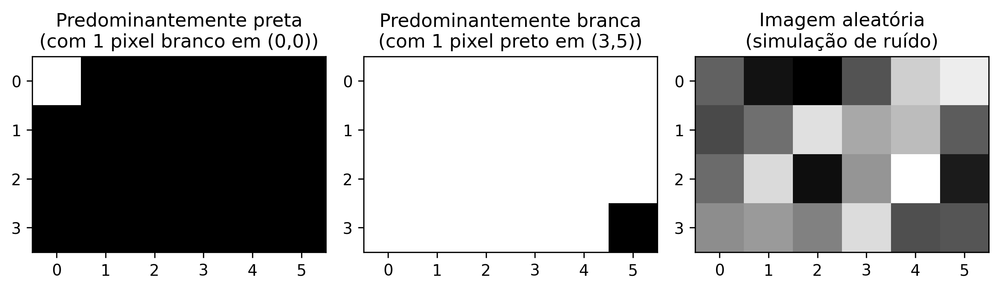

**Figura 1.6:** Exemplos de imagens sintéticas representadas matricialmente.


In [4]:
mm.show(
    [
        mm.read("tmp/fig_imagens_sinteticas_0.png"),
        mm.read("tmp/fig_imagens_sinteticas_1.png"),
        mm.read("tmp/fig_imagens_sinteticas_2.png"),
    ],
    titles=[
        'Predominantemente preta\n(com 1 pixel branco em (0,0))',
        'Predominantemente branca\n(com 1 pixel preto em (3,5))',
        'Imagem aleatória\n(simulação de ruído)',
    ],
    cols=3,
    axis=True,
    figsize=(9, 3),
)

## 1.10 Lendo e Exibindo Imagens

Em bibliotecas como o [OpenCV](https://opencv.org/?utm_source=chatgpt.com) (`cv::Mat`), imagens digitais são representadas computacionalmente como matrizes multidimensionais. Na `morph.hpp`, a estrutura `mm::Image` adota uma abordagem mais simples: um buffer linear de bytes (`std::vector<unsigned char>`), com altura, largura e número de canais explícitos.

Uma das operações fundamentais em PDI é a leitura de imagens.

Na `morph.hpp`, a função `mm::read()` permite carregar imagens tanto de arquivos locais quanto de URLs, como ilustrado na [Figura 1.7](#fig-01-natureza).

In [5]:
%%writefile tmp/fig_01_natureza.cpp
#define MM_OUT "tmp/fig_01_natureza.png"
// Compile: g++ -std=c++17 -o programa programa.cpp -I. -lcurl
#include "morph.hpp"
#include <iostream>
#include <string>
#include <filesystem>

//| label: fig-01-natureza
//| fig-cap: "Mandrill (Mandrillus sphinx) em ambiente natural. Crédito: Julien Renoult (CC BY 4.0)."
//| echo: true

int main() {
    std::string url     = "https://upload.wikimedia.org/wikipedia/commons/8/87/Mandrillus_sphinx_339428057.jpg";
    std::string caminho = "imagens/mandrill.png";

    mm::Image img_obj;

    if (!std::filesystem::exists(caminho)) {
        std::filesystem::create_directories("imagens");
        img_obj = mm::read(url);
        mm::write(img_obj, caminho);
    } else {
        img_obj = mm::read(caminho);
    }

    // A imagem já está no formato mm::Image
    mm::Image img = img_obj;

    std::cout << "Dimensões (H, W, Canais): (" << img.h << ", " << img.w << ", " << img.channels << ")" << std::endl;
    std::cout << "Tipo de dado: uint8_t" << std::endl;

    mm::show(img, MM_OUT, "Exemplo: Captura RGB");

    
// [pdi:state-io] auto-generated — do not edit by hand
std::filesystem::create_directories("tmp/state");
mm::write(img, "tmp/state/img_34.png");
// [pdi:state-io:end]
return 0;
}

Overwriting tmp/fig_01_natureza.cpp


In [6]:
!g++ -I. tmp/fig_01_natureza.cpp -o tmp/fig_01_natureza \
  && ./tmp/fig_01_natureza \
  && test -f "tmp/fig_01_natureza.png" \
  || echo "⚠ mm::show não gravou tmp/fig_01_natureza.png"

Dimensões (H, W, Canais): (1365, 2048, 3)
Tipo de dado: uint8_t
Exemplo: Captura RGB


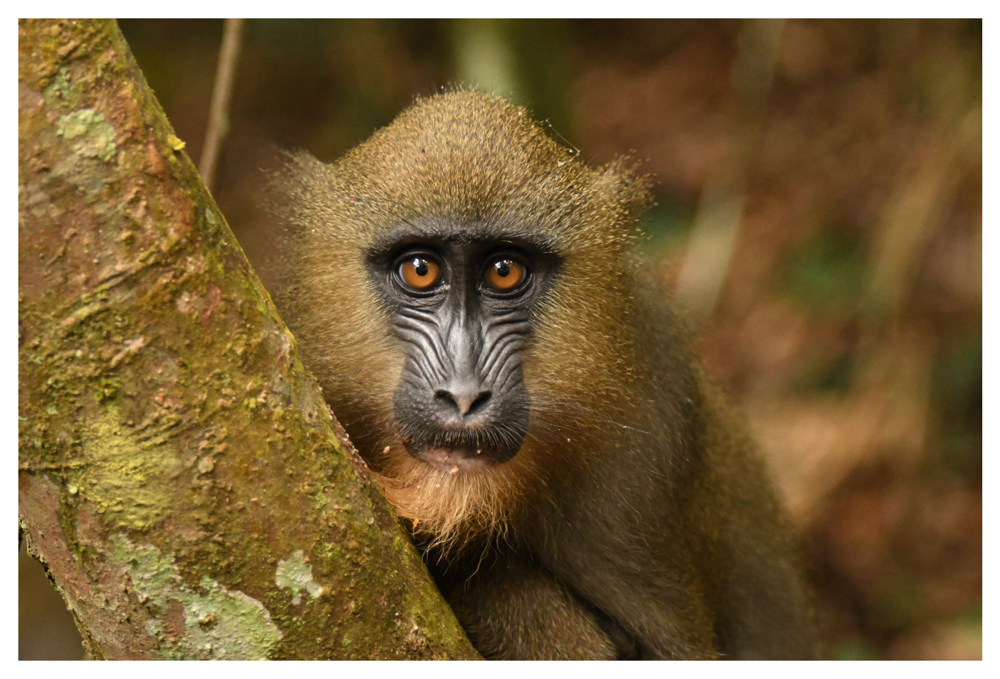

**Figura 1.7:** Mandrill (Mandrillus sphinx) em ambiente natural. Crédito: Julien Renoult (CC BY 4.0).


In [7]:
mm.show(mm.read("tmp/fig_01_natureza.png"))

### Alternativa: *Download* da Imagem para Armazenamento Local

Em ambientes nos quais a leitura direta de URLs esteja indisponível — devido a restrições de rede, políticas de *firewall* ou ausência de conectividade — uma alternativa consiste em baixar previamente a imagem para o sistema de arquivos local e então carregá-la com `mm::read()`. Na trilha C++, `mm::read` também aceita URLs diretamente (download interno via `curl`/`wget`); esta alternativa cobre o caso de baixar uma vez e reutilizar o arquivo local. No exemplo a seguir, o arquivo é salvo como `mandrill.png`.

```bash
!wget -O mandrill.png \
    https://upload.wikimedia.org/wikipedia/commons/8/87/Mandrillus_sphinx_339428057.jpg
```

```cpp
%%writefile tmp/ler_local.cpp
#define MM_OUT "tmp/mandrill_local.png"
#include "morph.hpp"

int main() {
    mm::Image img = mm::read("mandrill.png");   // lê do arquivo local
    mm::show(img, MM_OUT);                      // Exemplo: Captura RGB (arquivo local)
    return 0;
}
```

```bash
!g++ -I. tmp/ler_local.cpp -o tmp/ler_local && ./tmp/ler_local
```

#### Explicação

* `wget -O mandrill.png <URL>` realiza o *download* da imagem e a armazena localmente com o nome especificado;
* `mm::read("mandrill.png")` efetua a leitura do arquivo diretamente do sistema de arquivos, sem necessidade de requisições HTTP adicionais;
* essa estratégia reduz a dependência de conectividade durante a execução dos experimentos e evita *downloads* repetidos da mesma imagem.

> ### 💡 Nota
>
> O prefixo `!` é utilizado em ambientes baseados em *notebooks*, como [Jupyter Notebook](https://jupyter.org/?utm_source=chatgpt.com), [JupyterLab](https://jupyter.org/?utm_source=chatgpt.com) e [Google Colab](https://colab.research.google.com/?utm_source=chatgpt.com), para executar comandos do sistema operacional diretamente em células de código. Em terminais convencionais, o comando deve ser utilizado sem o prefixo `!`.
>
> Caso o utilitário `wget` não esteja instalado, pode-se utilizar alternativamente:
>
> ```bash
> !curl -o mandrill.png \
>     https://upload.wikimedia.org/wikipedia/commons/8/87/Mandrillus_sphinx_339428057.jpg
> ```

## 1.11 Conversão de Tipos e Limiarização

Conforme vimos, uma imagem colorida no espaço RGB é representada pela função:

<a id="eq-01-cinza"></a>
$$
f: \mathbb{E} \to \{0,1,\dots,255\}^3
$$

Ou seja, para cada pixel $(x,y)$, temos três valores $(R,G,B)$ que definem sua cor.

### Conversão para Tons de Cinza

Para converter uma imagem RGB em tons de cinza (*grayscale*), é necessário combinar os três canais em um único valor de intensidade $g$, que representa o brilho percebido. Como o olho humano não é igualmente sensível ao vermelho, verde e azul, utiliza-se uma **média ponderada**. O padrão [ITU-R BT.601](https://www.itu.int/rec/R-REC-BT.601/) ({ITU-R}, 2011) define os seguintes pesos:

$$
g = 0.299\,R + 0.587\,G + 0.114\,B \tag{1.3}
$$


Após o cálculo, o valor $g$ é arredondado para o inteiro mais próximo e ajustado ao intervalo $[0, 255]$. O resultado é uma nova imagem, agora em tons de cinza, representada por:

<a id="eq-01-limiar"></a>
$$
f_{\text{cinza}}: \mathbb{E} \to \{0,1,\dots,255\}
$$

### Limiarização (*Thresholding*)

A partir da imagem em tons de cinza $f_{\text{cinza}}(x,y)$, uma operação fundamental é a **limiarização**, que produz uma imagem **binária** (apenas preto e branco). Para isso, escolhe-se um valor de corte $T$ (geralmente no intervalo $[0,255]$) e define-se:

$$
f_{\text{bin}}(x,y) = 
\begin{cases} 
255 & \text{se } f_{\text{cinza}}(x,y) > T \\[4pt]
0 & \text{caso contrário}
\end{cases} \tag{1.4}
$$


**Exemplo:** Com $T = 128$, pixels com intensidade acima de 128 tornam-se brancos (255); os demais tornam-se pretos (0).

A limiarização é amplamente usada para **segmentar objetos do fundo**, extrair bordas ou criar máscaras binárias para processamento posterior. 

> **Nota:** O valor 255 representa o branco máximo em imagens de 8 bits, enquanto 0 representa o preto absoluto.

### Exemplo prático de conversão e limiarização

A [Figura 1.8](#fig-01-processamento-basico) ilustra os principais passos para transformar uma imagem colorida em tons de cinza e, em seguida, convertê-la em uma imagem binária por limiarização. 
O código a seguir implementa essas etapas:

In [8]:
%%writefile tmp/fig_01_processamento_basico.cpp
#define MM_OUT "tmp/fig_01_processamento_basico.png"
#include "morph.hpp"
#include <string>
#include <vector>
#include <filesystem>

int main() {
// [pdi:state-io] auto-generated — do not edit by hand
mm::Image img = mm::read("tmp/state/img_34.png");
// [pdi:state-io:end]

    // img já está inicializado (fornecido automaticamente)

    // 1. Converter para Tons de Cinza
    mm::Image img_gray = mm::gray(img);

    // 2. Aplicar limiar (Pixels > 128 tornam-se 255, outros 0)
    int limiar = 128;
    mm::Image img_binaria = mm::threshold(img_gray, limiar);

    // Uso da nova função
    mm::show(
        {img, img_gray, img_binaria}, 
        MM_OUT,
        {"Original", "Tons de Cinza", "Binária (T=" + std::to_string(limiar) + ")"},
        3
    );

    
// [pdi:state-io] auto-generated — do not edit by hand
std::filesystem::create_directories("tmp/state");
mm::write(img_gray, "tmp/state/img_gray_38.png");
// [pdi:state-io:end]

// [pdi:panel-io] auto-generated — do not edit by hand
std::filesystem::create_directories("tmp");
mm::write(img, "tmp/fig_01_processamento_basico_0.png");
mm::write(img_gray, "tmp/fig_01_processamento_basico_1.png");
mm::write(img_binaria, "tmp/fig_01_processamento_basico_2.png");
// [pdi:panel-io:end]
return 0;
}

Overwriting tmp/fig_01_processamento_basico.cpp


In [9]:
!g++ -I. tmp/fig_01_processamento_basico.cpp -o tmp/fig_01_processamento_basico \
  && ./tmp/fig_01_processamento_basico \
  && test -f "tmp/fig_01_processamento_basico.png" \
  || echo "⚠ mm::show não gravou tmp/fig_01_processamento_basico.png"

[1] Original
[2] Tons de Cinza
[3] Binária (T=128)


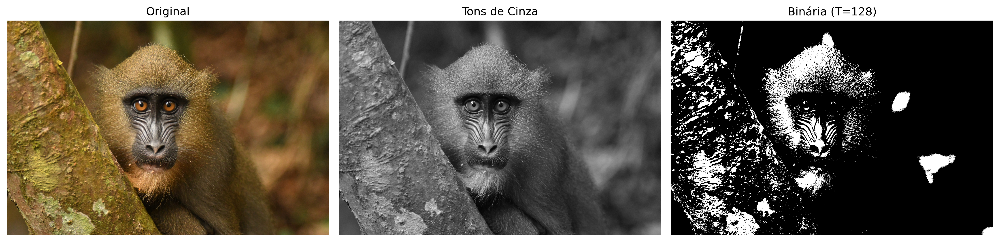

**Figura 1.8:** Processamento básico de imagens: (a) imagem original, (b) imagem em tons de cinza, (c) imagem binarizada por limiar (T=128).


In [10]:
mm.show(
    [
        mm.read("tmp/fig_01_processamento_basico_0.png"),
        mm.read("tmp/fig_01_processamento_basico_1.png"),
        mm.read("tmp/fig_01_processamento_basico_2.png"),
    ],
    titles=[
        'Original',
        'Tons de Cinza',
        'Binária (T=128)',
    ],
    cols=3,
)

## 1.12 Limiarização pelo método de Otsu

Conforme apresentado na [Equação 1.4](#eq-01-limiar), a limiarização converte uma imagem em tons de cinza para binária usando um valor de corte $T$. Até agora fixamos $T = 128$ manualmente.

```cpp
mm::Image img_bin_fixo = mm::threshold(img_gray, 128);
```

Entretanto, a escolha manual de $T$ nem sempre é trivial. A biblioteca `mm` oferece uma alternativa automática: quando o limiar **não é fornecido**, a função `mm::threshold(img_gray)` calcula o valor de $T$ pelo **método de Otsu** (OTSU, 1979). Esse método, que será detalhado em capítulos futuros, maximiza a variância entre classes do histograma (frequência de cada tom de cinza), separando automaticamente os pixels de objeto e fundo.

O código abaixo compara a limiarização manual ($T=128$) com a automática (Otsu). A binarização por Otsu é feita com `mm::threshold(img_gray)`; como a API mínima da `morph.hpp` não devolve o $T$ calculado, o valor exibido no rótulo da figura é recuperado com `cv2.threshold` na etapa de exibição (mesmo algoritmo, mesmo $T$).

In [11]:
%%writefile tmp/fig_01_otsu.cpp
#define MM_OUT "tmp/fig_01_otsu.png"
#include <iostream>
#include "morph.hpp"
#include <filesystem>

int main() {
// [pdi:state-io] auto-generated — do not edit by hand
mm::Image img_gray = mm::read("tmp/state/img_gray_38.png");
// [pdi:state-io:end]

    // img_gray já é fornecida (mm::Image)

    // Limiarização com T fixo (manual)
    int T_fixo = 128;
    mm::Image img_bin_fixo = mm::threshold(img_gray, T_fixo);

    // Limiarização pelo método de Otsu (T automático)
    int T_otsu = mm::otsu(img_gray);  // calcula T via Otsu
    mm::Image img_bin_otsu = mm::threshold(img_gray);  // usa o mesmo T de Otsu
    std::cout << "Limiar calculado por Otsu: T = " << T_otsu << "\n";
    // ou simplesmente:
    // img_bin_otsu = mm::threshold(img_gray);

    // Exibição lado a lado
    mm::show(
        {img_gray, img_bin_fixo, img_bin_otsu},
        MM_OUT,
        {"Tons de Cinza", "Binária (T=128)", "Binária (Otsu, T=" + std::to_string(T_otsu) + ")"},
        3
    );

    
// [pdi:panel-io] auto-generated — do not edit by hand
std::filesystem::create_directories("tmp");
mm::write(img_gray, "tmp/fig_01_otsu_0.png");
mm::write(img_bin_fixo, "tmp/fig_01_otsu_1.png");
mm::write(img_bin_otsu, "tmp/fig_01_otsu_2.png");
// [pdi:panel-io:end]
return 0;
}

Overwriting tmp/fig_01_otsu.cpp


In [12]:
!g++ -I. tmp/fig_01_otsu.cpp -o tmp/fig_01_otsu \
  && ./tmp/fig_01_otsu \
  && test -f "tmp/fig_01_otsu.png" \
  || echo "⚠ mm::show não gravou tmp/fig_01_otsu.png"

Limiar calculado por Otsu: T = 94


[1] Tons de Cinza
[2] Binária (T=128)
[3] Binária (Otsu, T=94)


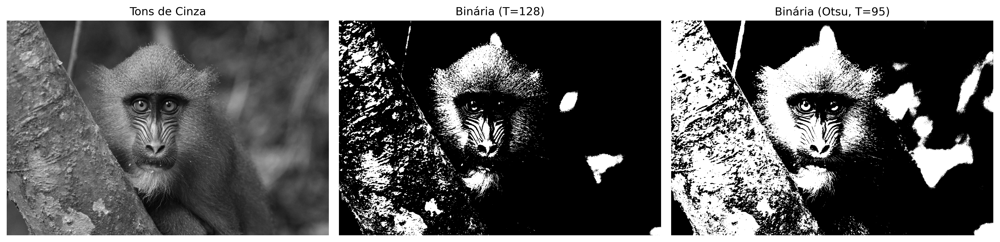

**Figura 1.9:** Comparação entre limiarização manual (T=128) e automática (Otsu) sobre a imagem em tons de cinza.


In [13]:
T_otsu = mm.otsu(mm.read("tmp/fig_01_otsu_0.png", grayscale=True))
mm.show(
    [
        mm.read("tmp/fig_01_otsu_0.png"),
        mm.read("tmp/fig_01_otsu_1.png"),
        mm.read("tmp/fig_01_otsu_2.png"),
    ],
    titles=[
        'Tons de Cinza',
        'Binária (T=128)',
        f"Binária (Otsu, T={T_otsu})",
    ],
    cols=3,
)

A [Figura 1.9](#fig-01-otsu) mostra que o limiar obtido por Otsu se adapta automaticamente à imagem, resultando em uma binarização mais eficiente do que um valor fixo, especialmente quando as intensidades do objeto e do fundo são bem separadas no histograma. Essa técnica é amplamente utilizada em sistemas de VC para binarização de documentos, detecção de objetos e pré‑processamento de imagens.

> ### 💡 Simplicidade da biblioteca `morph.hpp`
>
> Enquanto o OpenCV exige a chamada completa:
>
> ```cpp
> cv::Mat img_bin;
> double T_otsu = cv::threshold(img_gray, img_bin, 0, 255,
>                               cv::THRESH_BINARY | cv::THRESH_OTSU);
> ```
>
> a `morph.hpp` abstrai toda essa complexidade: basta chamar `mm::threshold(img_gray)`. O limiar de Otsu é calculado automaticamente e a imagem binária é devolvida diretamente. Essa abordagem permite concentrar-se no conceito, não nos detalhes de implementação.

## 1.13 Acesso a Pixels

Na `morph.hpp`, a imagem é um `mm::Image` com um buffer linear `data` (linha após linha, canais intercalados) e o método `at(y, x, c)` para acesso individual, seguindo a convenção matricial **linha** (eixo Y) e **coluna** (eixo X): `img.at(linha, coluna)` para tons de cinza e `img.at(linha, coluna, canal)` para cada canal de uma imagem RGB.

O código da [Figura 1.10](#fig-01-pixel-acesso) demonstra como extrair esses valores em imagens coloridas (RGB) e em tons de cinza, além de isolar a vizinhança imediata do ponto de interesse.

In [14]:
%%writefile tmp/fig_01_pixel_acesso.cpp
#define MM_OUT "tmp/fig_01_pixel_acesso.png"
#include "morph.hpp"
#include <iostream>
#include <string>

int main() {
// [pdi:state-io] auto-generated — do not edit by hand
mm::Image img = mm::read("tmp/state/img_34.png");
mm::Image img_gray = mm::read("tmp/state/img_gray_38.png");
// [pdi:state-io:end]

    // img e img_gray já estão inicializados aqui

    // 1. Coordenadas do pixel alvo (linha, coluna)
    int r = 600, c = 800;

    // 2. Acesso direto aos valores do pixel
    unsigned char pixel_cinza = img_gray.at(r, c);
    std::cout << "Pixel alvo (" << r << ", " << c << "):\n";
    std::cout << "  Tons de cinza (escalar) : " << (int)pixel_cinza << "\n";
    std::cout << "  Colorido (canais RGB)   : R=" << (int)img.at(r, c, 0) 
              << ", G=" << (int)img.at(r, c, 1) 
              << ", B=" << (int)img.at(r, c, 2) << "\n";

    // 3. Vizinhanca 3x3 ao redor de (r, c); o pixel central vai entre colchetes
    std::cout << "Matriz de vizinhanca 3x3 (tons de cinza):\n";
    for (int dy = -1; dy <= 1; dy++) {
        std::string linha = "";
        for (int dx = -1; dx <= 1; dx++) {
            int v = (int)img_gray.at(r + dy, c + dx);
            if (dy == 0 && dx == 0) {
                linha += "[" + std::to_string(v) + "]";
            } else {
                linha += " " + std::to_string(v) + " ";
            }
        }
        std::cout << "  " << linha << "\n";
    }

    // 4. Marca a posicao do pixel com um quadrado vermelho vazado (borda de
    //    3 px) numa copia da imagem e exibe (equivalente ao ponto do matplotlib).
    mm::Image marcada = img;  // cópia (semântica de valor)
    int lado = 20;   // meio-lado do quadrado, em pixels
    int esp = 5;     // espessura da borda

    for (int x = c - lado; x <= c + lado; x++) {
        for (int w = 0; w < esp; w++) {
            marcada.at(r - lado + w, x, 0) = 255;
            marcada.at(r - lado + w, x, 1) = 0;
            marcada.at(r - lado + w, x, 2) = 0;
            marcada.at(r + lado - w, x, 0) = 255;
            marcada.at(r + lado - w, x, 1) = 0;
            marcada.at(r + lado - w, x, 2) = 0;
        }
    }

    for (int y = r - lado; y <= r + lado; y++) {
        for (int w = 0; w < esp; w++) {
            marcada.at(y, c - lado + w, 0) = 255;
            marcada.at(y, c - lado + w, 1) = 0;
            marcada.at(y, c - lado + w, 2) = 0;
            marcada.at(y, c + lado - w, 0) = 255;
            marcada.at(y, c + lado - w, 1) = 0;
            marcada.at(y, c + lado - w, 2) = 0;
        }
    }

    // Mostra a imagem marcada
    mm::show(marcada, MM_OUT, "Localizacao do pixel (" + std::to_string(r) + ", " + std::to_string(c) + ")");

    return 0;
}

Overwriting tmp/fig_01_pixel_acesso.cpp


In [15]:
!g++ -I. tmp/fig_01_pixel_acesso.cpp -o tmp/fig_01_pixel_acesso \
  && ./tmp/fig_01_pixel_acesso \
  && test -f "tmp/fig_01_pixel_acesso.png" \
  || echo "⚠ mm::show não gravou tmp/fig_01_pixel_acesso.png"

Pixel alvo (600, 800):
  Tons de cinza (escalar) : 80
  Colorido (canais RGB)   : R=92, G=78, B=67
Matriz de vizinhanca 3x3 (tons de cinza):
   82  96  105 
   84 [80] 95 
   82  76  83 
Localizacao do pixel (600, 800)


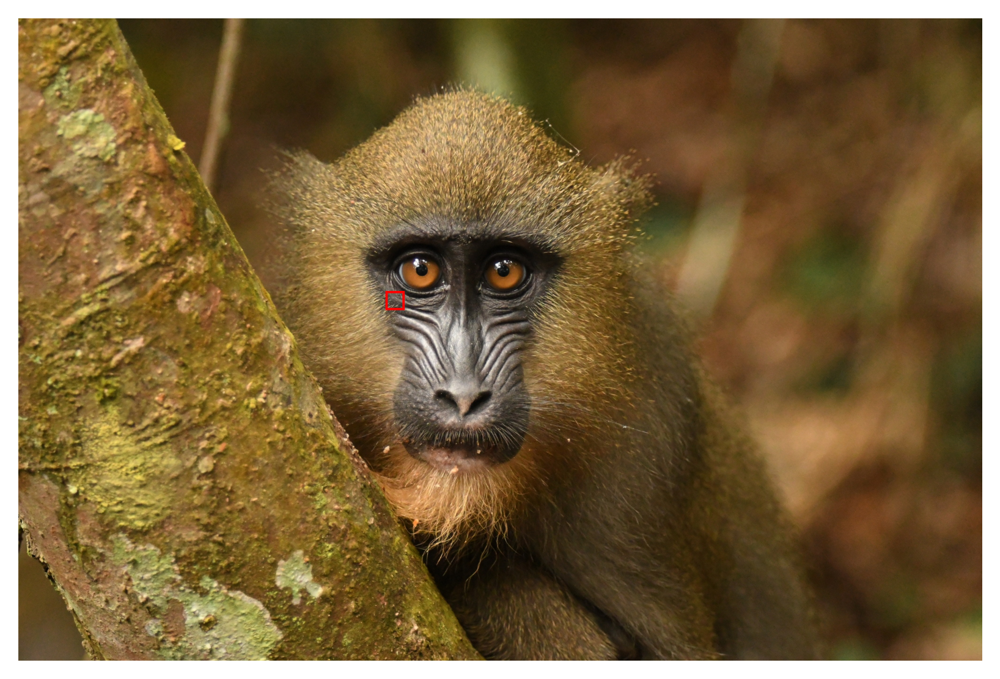

**Figura 1.10:** Acesso a um pixel específico (r, c) e a representação de sua vizinhança na imagem.


In [16]:
mm.show(mm.read("tmp/fig_01_pixel_acesso.png"))

**Acesso a pixel em C++ (`mm::Image`):**

* **Tons de cinza:** `img_gray.at(r, c)` devolve um `unsigned char` (0 a 255) com a intensidade do cinza no pixel.
* **RGB:** `img.at(r, c, 0)`, `img.at(r, c, 1)`, `img.at(r, c, 2)` acessam os canais **R**, **G** e **B** — um índice de canal por vez; não há vetor `[R, G, B]`.
* **Vizinhança $3\times 3$:** percorrida por dois laços aninhados sobre `img_gray.at(r + dy, c + dx)`, com `dy, dx` em $\{-1, 0, 1\}$ — não há fatiamento (*slicing*) como em NumPy. Essa varredura é a base para filtros espaciais e convoluções.
* Não há plotagem interativa (equivalente a `plt.plot`): para marcar a posição do pixel, a célula de código a seguir **desenha um quadrado vermelho vazado** ao redor dele numa cópia da imagem (`marcada = img.copy()`, depois `marcada.at(...)`) e exibe com `mm::show`.

A indexação é *zero-based*: `(0,0)` é o canto superior esquerdo. A primeira dimensão controla a **altura** (linhas/Y) e a segunda a **largura** (colunas/X).

## 1.14 Resumo

Neste capítulo, apresentaram-se os fundamentos de representação de imagens digitais: a definição de pixel, a estruturação de imagens em matrizes e o impacto da amostragem e da quantização na qualidade final:

- **Imagem digital** = função $f(x,y)$ que mapeia coordenadas para intensidades (escalares ou vetoriais).
- **Domínio**: conjunto finito $\mathbb{E} = \{(x,y) \in \mathbb{Z}^2 \mid 0 \le x < L,\; 0 \le y < H\}$.
- **Tipos principais**: binária ($\mathcal{V} = \{0, 255\}$), tons de cinza ($\mathcal{V} = [0,255]$) e RGB ($\mathcal{V} = [0,255]^3$).
- **Limiarização** converte tons de cinza em binária; o **método de Otsu** determina o valor de corte automaticamente maximizando a variância entre classes.

- A `morph.hpp` (ou `mm::`) oferece funções didáticas para operações básicas de PDI, como `mm::gray()`, `mm::threshold()`, `mm::show()` (sobrecarregada para 1 imagem ou várias).
- **Armadilha de cópia**: `std::vector` tem semântica de valor, mas ponteiros/referências compartilhados entre "linhas" de uma matriz reintroduzem o mesmo problema do NumPy — prefira `mm::Image`, que também copia por valor.
- Acesso a pixels via `img.at(linha, coluna)`, com indexação ***zero-based***.

O Capítulo 2 abordará **histogramas e equalização de contraste**.

## 1.15 🤖 Uso do Gemini Notebook como Tutor Complementar

Nesta edição, além dos *notebooks* interativos no Google Colab, o **Gemini Notebook** está disponível como ferramenta complementar de estudo. A plataforma utiliza exclusivamente os documentos fornecidos pelo autor como base de conhecimento, garantindo respostas coerentes com o conteúdo do livro.

> ### ❗ 🎓 Estude com o Tutor Inteligente
>
> Acesse o ambiente do capítulo pelo *link* abaixo e explore especialmente as opções **Guia de Estudo** e **Conversa** para aprofundar sua compreensão.
>
> [🚀 ACESSAR Gemini Notebook: CAPÍTULO 01](https://notebooklm.google.com/notebook/022d09fb-4dee-46b1-ad18-787987fe976d)
>
> #### 🌐 Idioma e Linguagem de Programação
>
> O projeto deste capítulo no Gemini Notebook foi construído apenas com o texto em **português** e os exemplos de código em **Python**. Se você está estudando pela edição em inglês ou francês, ou acompanhando a trilha em C++, as respostas do tutor podem não corresponder exatamente à versão que você está lendo.
>
> #### ⚠️ Aviso sobre Conteúdo Gerado por IA
>
> A IA é uma poderosa aliada nos estudos, mas o conteúdo gerado pode conter **erros ou imprecisões**. Consulte sempre **livros, artigos científicos e outras fontes acadêmicas confiáveis** para validar as informações. Sempre que possível, execute os exemplos práticos fornecidos neste capítulo para verificar os resultados.

### Funcionalidades Disponíveis na Plataforma

O **Gemini Notebook** oferece uma suíte avançada de ferramentas baseadas em IA para transformar o conteúdo estático do livro em uma experiência de aprendizado dinâmica e multimídia. A plataforma utiliza técnicas de **RAG** (*Retrieval-Augmented Generation*), fundamentadas no trabalho de Lewis (2020), para basear as respostas estritamente nos documentos fornecidos e minimizar a ocorrência de alucinações.

As principais funcionalidades incluem:

* **Resumos Multimodais (Áudio e Vídeo)**: Geração de conversas naturais entre especialistas no formato de **Resumo em Áudio** (estilo *podcast*) e **Resumo em Vídeo**, discutindo os temas centrais do capítulo, como as diferenças entre PDI e VC, ou a interpretação de transformações como a limiarização e o método de Otsu.
* **Visualização de Estruturas (Mapa Mental e Infográfico)**: Criação automática de diagramas que conectam visualmente os conceitos, por exemplo, o fluxo de processamento desde a captura da imagem digital, passando pela conversão para tons de cinza, limiarização e segmentação binária.
* **Ferramentas de Avaliação (Teste e Cartões Didáticos)**: Geração de **Testes** de múltipla escolha e **Cartões Didáticos** (*flashcards*) para fixação de conhecimento, baseados no texto autoral (ex.: perguntas sobre a fórmula de conversão RGB→cinza ou sobre o funcionamento do limiar global e de Otsu).
* **Apoio à Apresentação (*Slides* e Relatórios)**: Auxílio na estruturação de **Apresentações de *Slides*** e na redação de **Relatórios** técnicos, facilitando a comunicação de resultados de experimentos com imagens.
* **Análise de Dados (Tabela de Dados)**: Organização de dados extraídos do texto em tabelas estruturadas, auxiliando na compreensão de exemplos práticos, como a comparação entre diferentes valores de limiar.
* ***Chat* Contextualizado**: Permite o questionamento direto sobre o código e a teoria, como: *"Como implementar a conversão de RGB para tons de cinza usando os pesos do padrão ITU‑R BT.601?"* ou *"O que acontece com a imagem binária se eu escolher um limiar T=200 em vez de T=128?"*.

## 1.16 Lista de Exercícios

1. (15%) Com suas próprias palavras, defina **imagem digital** e **pixel**. Dê um exemplo concreto de como uma imagem colorida (RGB) é representada matricialmente no computador.

2. (15%) Explique as diferenças entre **imagem binária**, **tons de cinza (8 bits)** e **colorida RGB**, indicando a faixa de valores possíveis para cada pixel em cada tipo.

3. (20%) Considerando a fórmula de conversão RGB → tons de cinza do padrão ITU‑R BT.601:
   $$g = 0.299\,R + 0.587\,G + 0.114\,B$$
   Calcule o valor do pixel em tons de cinza para $(R,G,B) = (80, 180, 30)$. Arredonde para o inteiro mais próximo.

4. (20%) O que é **limiarização** (*thresholding*)? Explique a diferença entre escolher um limiar $T$ fixo (ex.: $T=128$) e utilizar o **método de Otsu** para determinação automática do limiar. Em poucas palavras, como o método de Otsu escolhe o limiar?

5. (15%) No contexto da biblioteca didática `mm` discutida no capítulo, responda:
   - a) (7,5%) Como se acessa o valor do pixel na posição (linha=50, coluna=60) de uma imagem em tons de cinza `img_gray`?
   - b) (7,5%) Qual é a vantagem de usar `mm::threshold(img_gray)` sem passar o limiar? Compare com a chamada equivalente no OpenCV (`cv::threshold`).

6. (15%) O que os campos `h`, `w` e `channels` de um `mm::Image` representam para uma imagem RGB? Dê um exemplo concreto com uma imagem de 640×480 pixels.

## Referências do Capítulo


A fundamentação teórica deste capítulo compreende as seguintes obras de PDI e VC:
* Gonzalez (2018) para os fundamentos de **Processamento Digital de Imagens** (PDI).
* Singh (2019) para a implementação prática de métodos de **processamento e análise de imagens**.
* Szeliski (2022) para o estudo de VC e algoritmos fundamentais.
* Bradski (2008) para a aplicação da biblioteca **OpenCV** em ambiente Python.
* Lewis (2020) para o conceito de **geração aumentada por recuperação (RAG)**, utilizado no suporte ao processamento de informações deste material.

BRADSKI, Gary; KAEHLER, Adrian. **Learning OpenCV: Computer vision with the OpenCV library**. " O'Reilly Media, Inc.", 2008.

GONZALEZ, R. C.; WOODS, R. E. **Digital Image Processing**. New York, Pearson, 2018.

KNUTH, D. E. **Literate Programming**. 1984.

LEWIS, Patrick *et al*. **Retrieval-augmented generation for knowledge-intensive nlp tasks**. 2020.

OTSU, Nobuyuki. **A Threshold Selection Method from Gray-Level Histograms**. 1979.

SINGH, Himanshu. **Practical machine learning and image processing**. Springer, 2019.

SZELISKI, Richard. **Computer Vision: Algorithms and Applications**. Springer, 2022.

ZAMPIROLLI, Francisco de Assis *et al*. **Teaching Hands-On Digital Image Processing with morph.py: Methods and Comprehensive Results**. 2025.

{ITU-R}. **Recommendation BT.601: Studio encoding parameters of digital television for standard 4:3 and wide screen 16:9 aspect ratios**. 2011.